In [1]:
pip install scanpy -q

Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install igraph -q

Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install louvain -q

Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install pandas -q

Note: you may need to restart the kernel to use updated packages.


In [5]:
import scanpy as sc
import pandas as pd
import math
import matplotlib.pyplot as plt

In [6]:
import warnings
warnings.filterwarnings('ignore')

In [7]:
adata = sc.read_h5ad('AnnDataObject.h5ad')

In [8]:
mask = adata.obs['sample'] == 'enz_taz'
adata = adata[mask, :]

# Quality Control

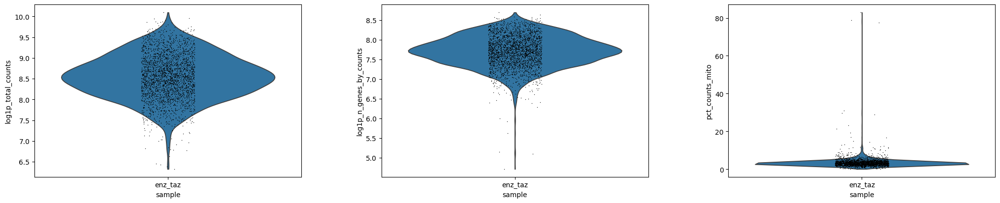

In [9]:
# Violin - genotype - log
sc.pl.violin(
  adata,
  keys=['log1p_total_counts', 'log1p_n_genes_by_counts', 'pct_counts_mito'],
  groupby='sample',
  save='-genotype-log.png'
)

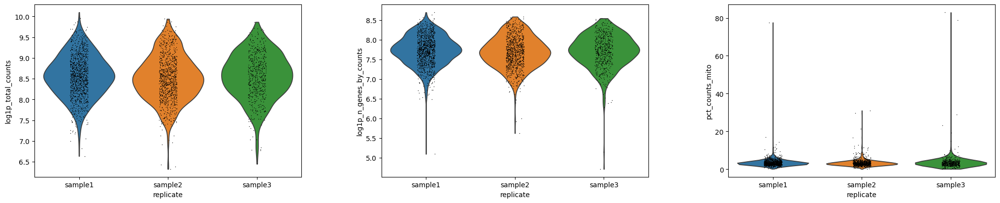

In [10]:
# Violin - sex - log
sc.pl.violin(
  adata,
  keys=['log1p_total_counts', 'log1p_n_genes_by_counts', 'pct_counts_mito'],
  groupby='replicate',
  save='-sex-log.png'
)

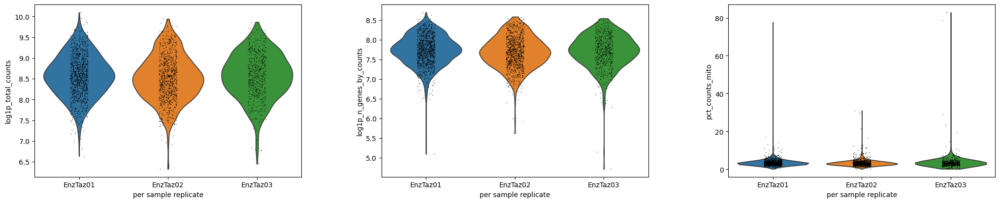

In [11]:
# Violin - sex - log
sc.pl.violin(
  adata,
  keys=['log1p_total_counts', 'log1p_n_genes_by_counts', 'pct_counts_mito'],
  groupby='per_sample_replicate',
  save='-sex-log.png'
)

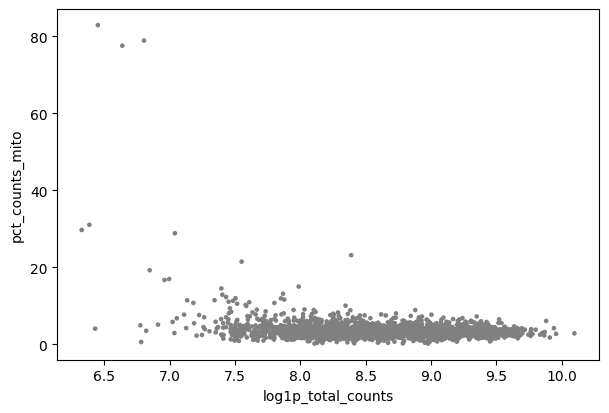

In [12]:
# Scatter - mito x UMIs
sc.pl.scatter(
  adata,
  x='log1p_total_counts',
  y='pct_counts_mito',
  save='-mitoxUMIs.png'
)

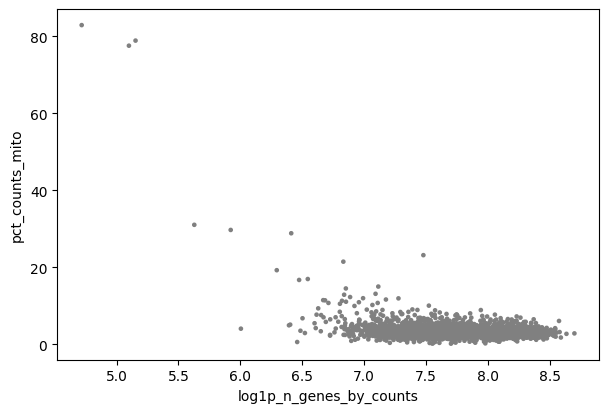

In [13]:
# Scatter - mito x genes
sc.pl.scatter(
  adata,
  x='log1p_n_genes_by_counts',
  y='pct_counts_mito',
  save='-mitoxgenes.png'
)

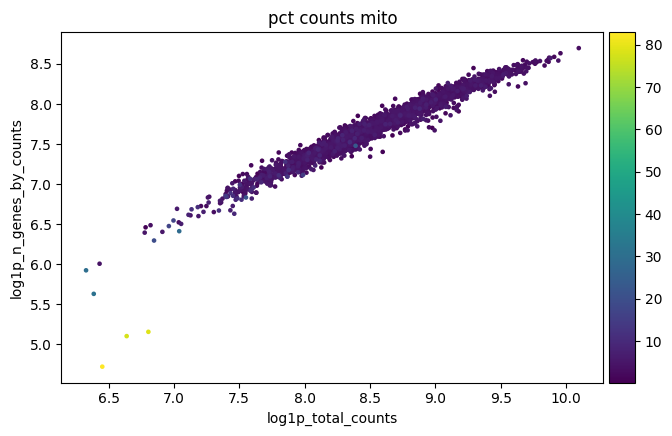

In [14]:
# Scatter - genes x UMIs
sc.pl.scatter(
  adata,
  x='log1p_total_counts',
  y='log1p_n_genes_by_counts',
  color='pct_counts_mito',
  save='-genesxUMIs.png'
)

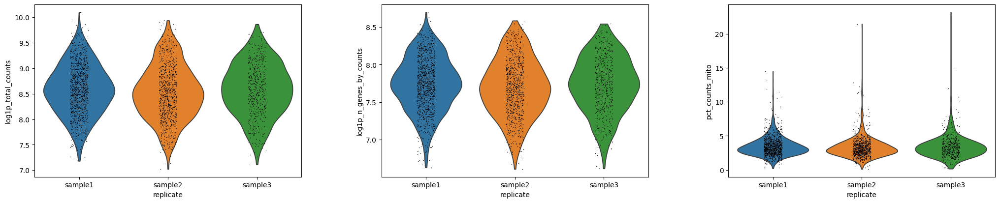

In [15]:
genes_filtered_obj = adata[adata.obs['log1p_n_genes_by_counts'] >= 6.6]
#genes_filtered_obj = genes_filtered_obj[genes_filtered_obj.obs['log1p_n_genes_by_counts'] <= 20.0]

# Violin - Filterbygenes
sc.pl.violin(
  genes_filtered_obj,
  keys=['log1p_total_counts', 'log1p_n_genes_by_counts', 'pct_counts_mito'],
  groupby='replicate',
  save='-Filterbygenes.png'
)

In [16]:
# 17051 × 36601
print(genes_filtered_obj)

View of AnnData object with n_obs × n_vars = 2691 × 36601
    obs: 'batch', 'sample', 'replicate', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'n_genes', 'pct_counts_in_top_50_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'per_sample_replicate'
    var: 'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'n_cells', 'mito'
    uns: 'sample_colors', 'replicate_colors', 'per_sample_replicate_colors'


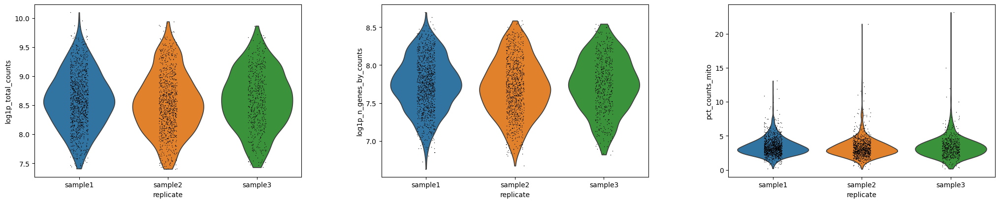

In [17]:
counts_filtered_obj = genes_filtered_obj[genes_filtered_obj.obs['log1p_total_counts'] >=  7.4]
counts_filtered_obj = counts_filtered_obj[counts_filtered_obj.obs['log1p_total_counts'] <= 10.6]

# Violin - Filterbycounts
sc.pl.violin(
  counts_filtered_obj,
  keys=['log1p_total_counts', 'log1p_n_genes_by_counts', 'pct_counts_mito'],
  groupby='replicate',
  save='-Filterbycounts.png'
)

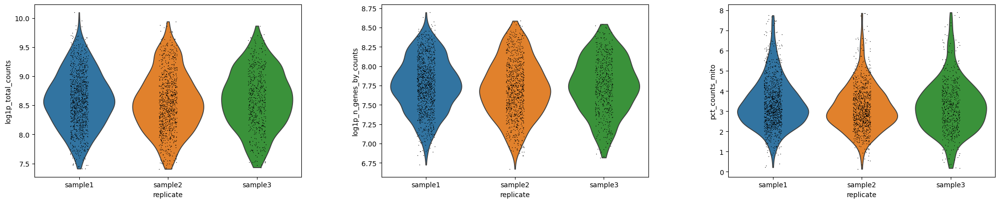

In [18]:
mito_filtered_obj = counts_filtered_obj[counts_filtered_obj.obs['pct_counts_mito'] >=  0]
mito_filtered_obj = mito_filtered_obj[mito_filtered_obj.obs['pct_counts_mito'] <= 8]

# Violin - Filterbymito
sc.pl.violin(
  mito_filtered_obj,
  keys=['log1p_total_counts', 'log1p_n_genes_by_counts', 'pct_counts_mito'],
  groupby='replicate',
  save='-Filterbymito.png'
)

In [19]:
filtered_obj = genes_filtered_obj.copy()

sc.pp.filter_genes(filtered_obj, min_cells=3)
sc.pp.filter_genes(filtered_obj, max_cells=1000000000)

#16803 × 36601
print(filtered_obj)

AnnData object with n_obs × n_vars = 2691 × 20959
    obs: 'batch', 'sample', 'replicate', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'n_genes', 'pct_counts_in_top_50_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'per_sample_replicate'
    var: 'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'n_cells', 'mito'
    uns: 'sample_colors', 'replicate_colors', 'per_sample_replicate_colors'


# Normalise Data

In [20]:
output_h5ad = filtered_obj.copy()
sc.pp.normalize_total(output_h5ad)

In [21]:
output_h5ad = sc.pp.log1p(output_h5ad, copy=True)  # below function requires log scaled data
sc.pp.highly_variable_genes(output_h5ad)

# Clustering - PCA Components

In [22]:
scaled_data = sc.pp.scale(output_h5ad, max_value=10.0, copy=True)

In [23]:
pca_components = sc.tl.pca(scaled_data, n_comps=50, copy=True)

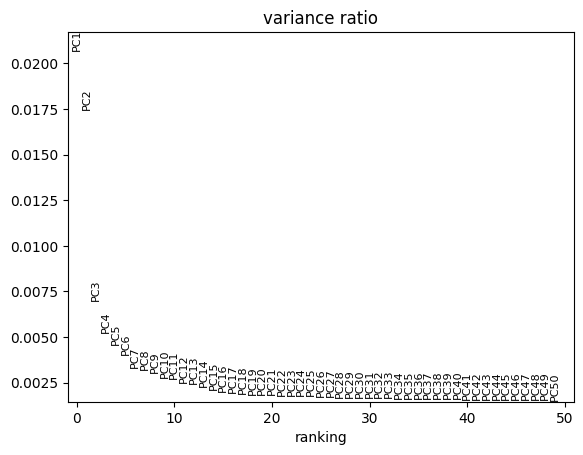

In [24]:
sc.pl.pca_variance_ratio(pca_components, n_pcs=50, save='-variance-ratio.png')

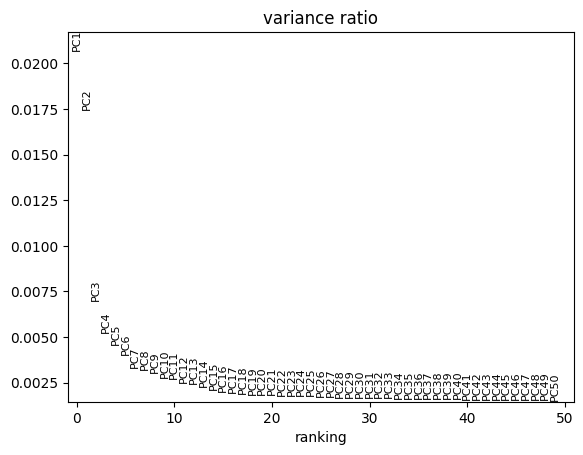

In [25]:
sc.pl.pca_variance_ratio(pca_components, n_pcs=50, save='-variance-ratio.png')

In [26]:
neighbours = sc.pp.neighbors(pca_components, n_neighbors=15, use_rep='X_pca', n_pcs=25, copy=True)

2025-03-10 22:05:07.963994: I tensorflow/core/util/port.cc:111] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-03-10 22:05:07.980433: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-03-10 22:05:07.980449: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-03-10 22:05:07.980463: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-03-10 22:05:07.983840: I tensorflow/core/platform/cpu_feature_g

In [27]:
tsne_components = sc.tl.tsne(neighbours, use_rep='X_pca', perplexity=30, copy=True)

In [28]:
umap_components = sc.tl.umap(tsne_components, copy=True)

# Find Clusters

In [29]:
# Find Clusters
clusters = sc.tl.louvain(umap_components, resolution=0.6, copy=True)

In [30]:
markers_cluster = sc.tl.rank_genes_groups(clusters, groupby="louvain", method='t-test_overestim_var', n_genes=25, copy=True)

In [31]:
markers_genotype = sc.tl.rank_genes_groups(markers_cluster, groupby="sample", method='t-test_overestim_var', n_genes=25, copy=True)

In [32]:
def generate_marker_table(adata):
    # extract marker table metadata
    res = adata.uns['rank_genes_groups']

    # generate DataFrame from metadata
    res_df = pd.DataFrame({
                "genes": pd.DataFrame(res["names"]).stack(),
                "scores": pd.DataFrame(res["scores"]).stack(),
                "logfoldchanges": pd.DataFrame(res["logfoldchanges"]).stack(),
                "pvals": pd.DataFrame(res["pvals"]).stack(),
                "pvals_adj": pd.DataFrame(res["pvals_adj"]).stack(),
            })

    # convert row names to columns
    res_df.index.name = 'newhead'
    res_df.reset_index(inplace=True)

    # rename generic column names
    res_df = res_df.rename(columns={'level_0': 'rank', 'level_1':'cluster'})

    # reorder columns
    res_df = res_df.reindex(columns=['cluster', 'rank', 'genes', 'scores', 'logfoldchanges', 'pvals', 'pvals_adj'])

    # insert ref column
    res_df.insert(2, 'ref', 'rest')

    return res_df

In [33]:
# Generate marker tables
cluster_marker_table = generate_marker_table(markers_cluster)
genotype_marker_table = generate_marker_table(markers_genotype)

display(cluster_marker_table.head(4))
display(genotype_marker_table.head(4))

,cluster,rank,ref,genes,scores,logfoldchanges,pvals,pvals_adj
0,0,0,rest,LUZP2,16.920610,NaN,5.605117e-58,1.174776e-53
1,1,0,rest,RPL36,20.738453,NaN,5.268148e-82,1.104151e-77
2,2,0,rest,MME,19.200962,NaN,4.542325e-71,9.520258e-67
3,3,0,rest,FOS,16.016436,NaN,8.049928e-51,1.687184e-46


,cluster,rank,ref,genes,scores,logfoldchanges,pvals,pvals_adj
0,enz_taz,0,rest,AC007325.4,0.0,NaN,1.0,1.0
1,enz_taz,1,rest,TRAM2-AS1,0.0,NaN,1.0,1.0
2,enz_taz,2,rest,PLA2G7,0.0,NaN,1.0,1.0
3,enz_taz,3,rest,AL591242.1,0.0,NaN,1.0,1.0


In [34]:
cluster_marker_table.index

RangeIndex(start=0, stop=150, step=1)

In [35]:
# Join two datasets

cluster_joined = pd.merge(cluster_marker_table, markers_cluster.var, left_on='genes', right_index=True)
genotype_joined = pd.merge(genotype_marker_table, markers_genotype.var, left_on='genes', right_index=True)

display(cluster_joined.head(5))
display(genotype_joined.head(5))

,cluster,rank,ref,genes,scores,logfoldchanges,pvals,pvals_adj,gene_ids,feature_types,...,log1p_total_counts,n_counts,n_cells,mito,highly_variable,means,dispersions,dispersions_norm,mean,std
0,0,0,rest,LUZP2,16.920610,NaN,5.605117e-58,1.174776e-53,ENSG00000187398,Gene Expression,...,12.488096,265161.0,2609,False,True,2.907041,2.366604,2.284973,2.588188,0.892229
1,1,0,rest,RPL36,20.738453,NaN,5.268148e-82,1.104151e-77,ENSG00000130255,Gene Expression,...,12.845864,379216.0,2649,False,False,2.807454,1.570109,-1.292190,2.649748,0.625846
2,2,0,rest,MME,19.200962,NaN,4.542325e-71,9.520258e-67,ENSG00000196549,Gene Expression,...,12.125881,184587.0,2509,False,True,2.166731,1.437934,1.603263,1.910638,0.791695
3,3,0,rest,FOS,16.016436,NaN,8.049928e-51,1.687184e-46,ENSG00000170345,Gene Expression,...,10.341452,30990.0,1490,False,True,1.084265,1.820706,3.999838,0.703495,0.790033
4,4,0,rest,STMN1,16.194931,NaN,7.777703e-39,1.630129e-34,ENSG00000117632,Gene Expression,...,9.510371,13498.0,456,False,True,0.222487,0.875229,2.986411,0.137799,0.345517


,cluster,rank,ref,genes,scores,logfoldchanges,pvals,pvals_adj,gene_ids,feature_types,...,log1p_total_counts,n_counts,n_cells,mito,highly_variable,means,dispersions,dispersions_norm,mean,std
0,enz_taz,0,rest,AC007325.4,0.0,NaN,1.0,1.0,ENSG00000278817,Gene Expression,...,5.375278,215.0,38,False,False,0.014212,0.226392,0.303536,0.009468,0.084071
1,enz_taz,1,rest,TRAM2-AS1,0.0,NaN,1.0,1.0,ENSG00000225791,Gene Expression,...,6.904751,996.0,140,False,False,0.045939,0.165972,0.053706,0.031749,0.146944
2,enz_taz,2,rest,PLA2G7,0.0,NaN,1.0,1.0,ENSG00000146070,Gene Expression,...,4.644391,103.0,18,False,False,0.005983,0.055385,-0.403562,0.004149,0.053122
3,enz_taz,3,rest,AL591242.1,0.0,NaN,1.0,1.0,ENSG00000242973,Gene Expression,...,3.433987,30.0,4,False,False,0.001341,0.219143,0.273563,0.000900,0.025512
4,enz_taz,4,rest,TDRD6,0.0,NaN,1.0,1.0,ENSG00000180113,Gene Expression,...,3.465736,31.0,9,False,False,0.003175,0.167094,0.058344,0.002147,0.039273


In [36]:
# Cut columns from tables

cluster_markers_named = cluster_joined[['cluster', 'ref', 'rank', 'genes', 'scores', 'logfoldchanges', 'pvals', 'pvals_adj']]
genotype_markers_named = genotype_joined[['cluster', 'ref', 'rank', 'genes', 'scores', 'logfoldchanges', 'pvals', 'pvals_adj']]

display(cluster_markers_named.head(5))
display(genotype_markers_named.head(5))

,cluster,ref,rank,genes,scores,logfoldchanges,pvals,pvals_adj
0,0,rest,0,LUZP2,16.920610,NaN,5.605117e-58,1.174776e-53
1,1,rest,0,RPL36,20.738453,NaN,5.268148e-82,1.104151e-77
2,2,rest,0,MME,19.200962,NaN,4.542325e-71,9.520258e-67
3,3,rest,0,FOS,16.016436,NaN,8.049928e-51,1.687184e-46
4,4,rest,0,STMN1,16.194931,NaN,7.777703e-39,1.630129e-34


,cluster,ref,rank,genes,scores,logfoldchanges,pvals,pvals_adj
0,enz_taz,rest,0,AC007325.4,0.0,NaN,1.0,1.0
1,enz_taz,rest,1,TRAM2-AS1,0.0,NaN,1.0,1.0
2,enz_taz,rest,2,PLA2G7,0.0,NaN,1.0,1.0
3,enz_taz,rest,3,AL591242.1,0.0,NaN,1.0,1.0
4,enz_taz,rest,4,TDRD6,0.0,NaN,1.0,1.0


## Number of cells per cluster

In [54]:
clusters.obs['louvain'].value_counts()

0    681
1    676
2    641
3    457
4    160
5     76
Name: louvain, dtype: int64

# Differential Gene Expression Analysis

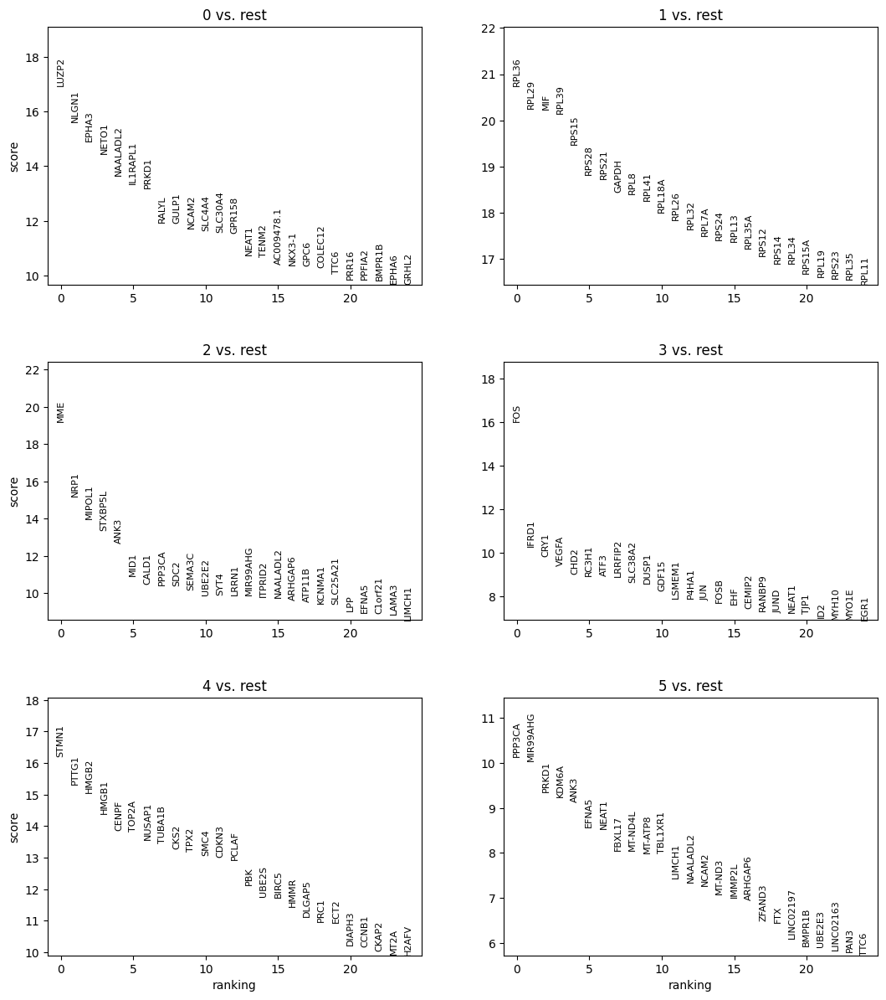

In [37]:
sc.tl.rank_genes_groups(clusters, groupby="louvain", method='t-test_overestim_var', key_added = "t-test_ov")
sc.pl.rank_genes_groups(clusters, n_genes=25, sharey=False, key = "t-test_ov", ncols=2, save="_t-test_ov_enz-taz.png")

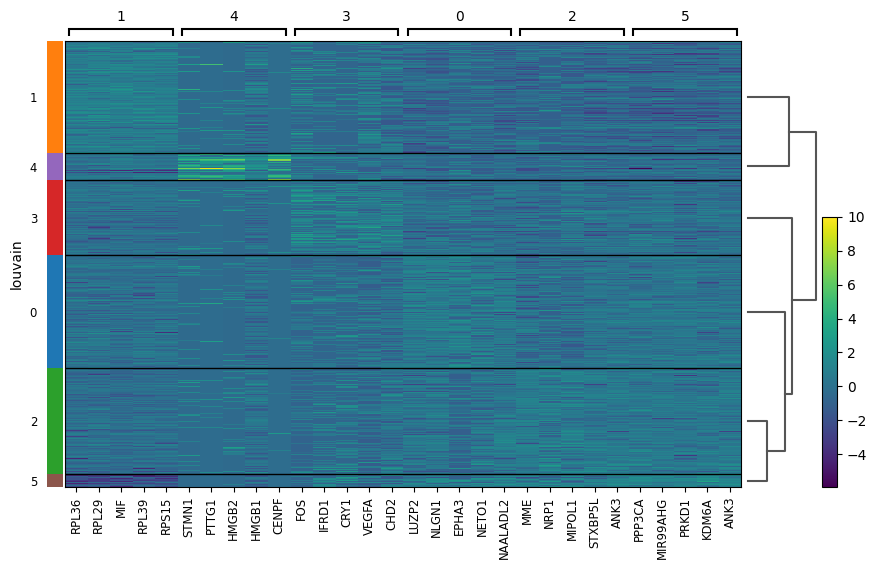

In [38]:
sc.pl.rank_genes_groups_heatmap(clusters, n_genes=5, key="t-test_ov", groupby="louvain", show_gene_labels=True, save="_enz-taz.png")

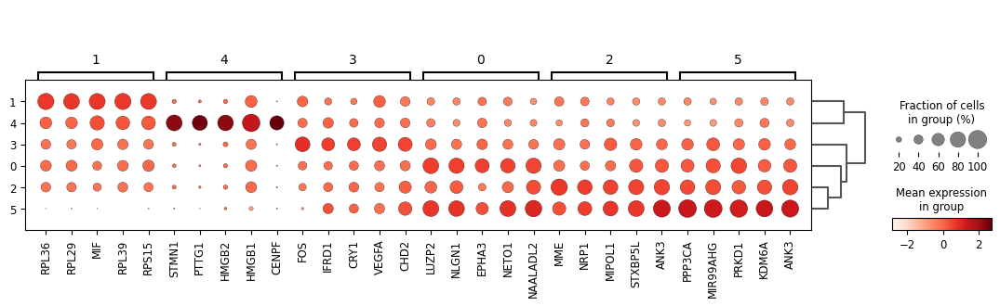

In [39]:
sc.pl.rank_genes_groups_dotplot(clusters, n_genes=5, key="t-test_ov", groupby="louvain", save="_enz-taz.png")

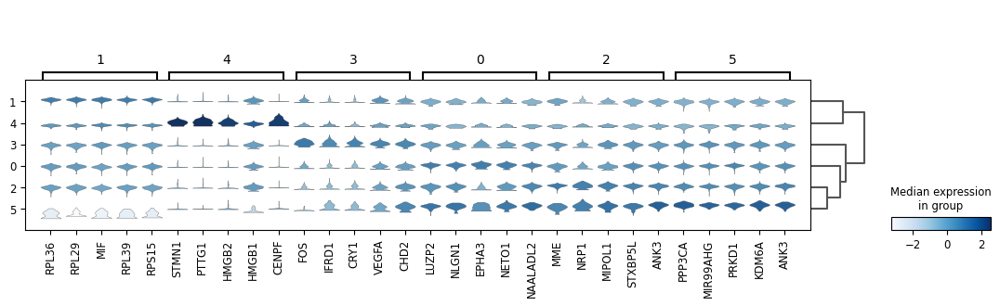

In [40]:
sc.pl.rank_genes_groups_stacked_violin(clusters, n_genes=5, key="t-test_ov", groupby="louvain", save="_enz-taz.png")

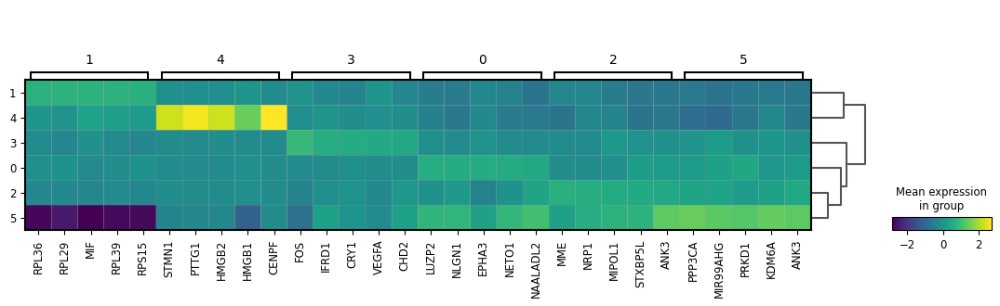

In [41]:
sc.pl.rank_genes_groups_matrixplot(clusters, n_genes=5, key="t-test_ov", groupby="louvain", save="_enz-taz.png")

In [42]:
sorted_markers = cluster_markers_named.sort_values(by='scores', ascending=False)

In [43]:
sorted_markers.head(100)

,cluster,ref,rank,genes,scores,logfoldchanges,pvals,pvals_adj
1,1,rest,0,RPL36,20.738453,NaN,5.268148e-82,1.104151e-77
7,1,rest,1,RPL29,20.251701,NaN,1.332798e-79,1.164966e-75
13,1,rest,2,MIF,20.237244,NaN,1.667493e-79,1.164966e-75
19,1,rest,3,RPL39,20.150745,NaN,2.271414e-78,1.190164e-74
25,1,rest,4,RPS15,19.478333,NaN,6.194287e-74,2.596521e-70
...,...,...,...,...,...,...,...,...
144,0,rest,24,GRHL2,9.666291,NaN,2.014012e-21,1.623526e-18
98,2,rest,16,ARHGAP6,9.609215,NaN,4.206469e-21,4.897966e-18
104,2,rest,17,ATP11B,9.536141,NaN,7.188150e-21,7.929286e-18
110,2,rest,18,KCNMA1,9.440061,NaN,1.890232e-20,1.980869e-17


In [44]:
def plot_embedding_with_title(adata, basis, colors, title, save_title, use_raw=False, nrows=None, ncols=None):
    """
    Plots the embeddings for given colors and adds a title for the entire figure.
    
    Parameters:
    - adata: AnnData object containing the data
    - basis: str, basis for the embedding (e.g., 'tsne', 'umap')
    - colors: list of str, names of the annotations or genes to color the plots by
    - title: str, title for the entire figure
    - use_raw: bool, whether to use the raw attribute of adata
    - nrows: int, number of rows in the grid
    - ncols: int, number of columns in the grid
    """
    num_plots = len(colors)
    
    if nrows is None and ncols is None:
        # Default to a square-ish grid if not specified
        nrows = math.ceil(math.sqrt(num_plots))
        ncols = math.ceil(num_plots / nrows)
    elif nrows is None:
        nrows = math.ceil(num_plots / ncols)
    elif ncols is None:
        ncols = math.ceil(num_plots / nrows)
    
    fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 5 * nrows))
    axes = axes.flatten()  # Flatten the axes array for easy iteration

    for i, color in enumerate(colors):
        sc.pl.embedding(
            adata,
            basis=basis,
            color=color,
            use_raw=use_raw,
            ax=axes[i],
            show=False
        )
    
    # Remove any empty subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])
    
    fig.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)  # Adjust the top to make space for the title
    plt.savefig(save_title)
    plt.show()

Top genes in cluster 0


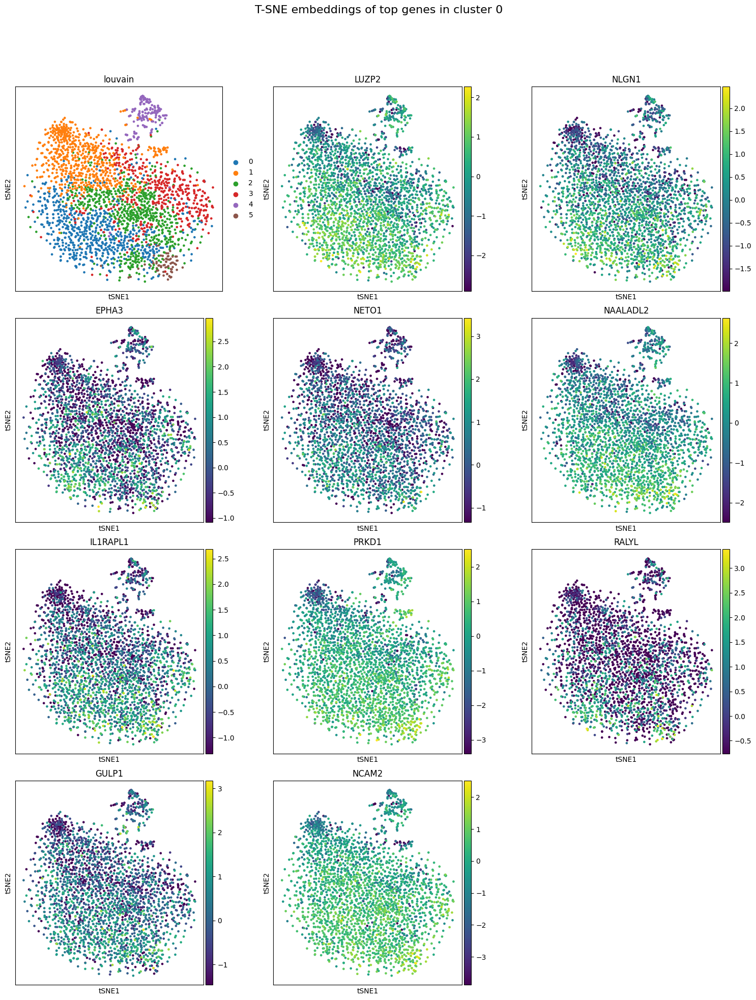

Top genes in cluster 1


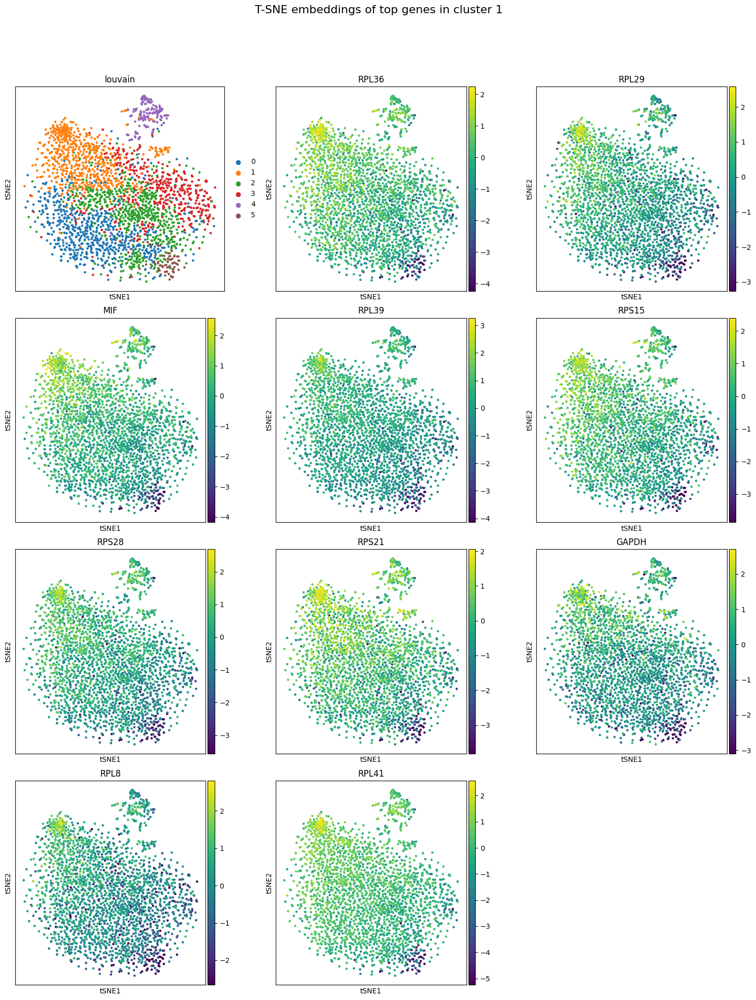

Top genes in cluster 2


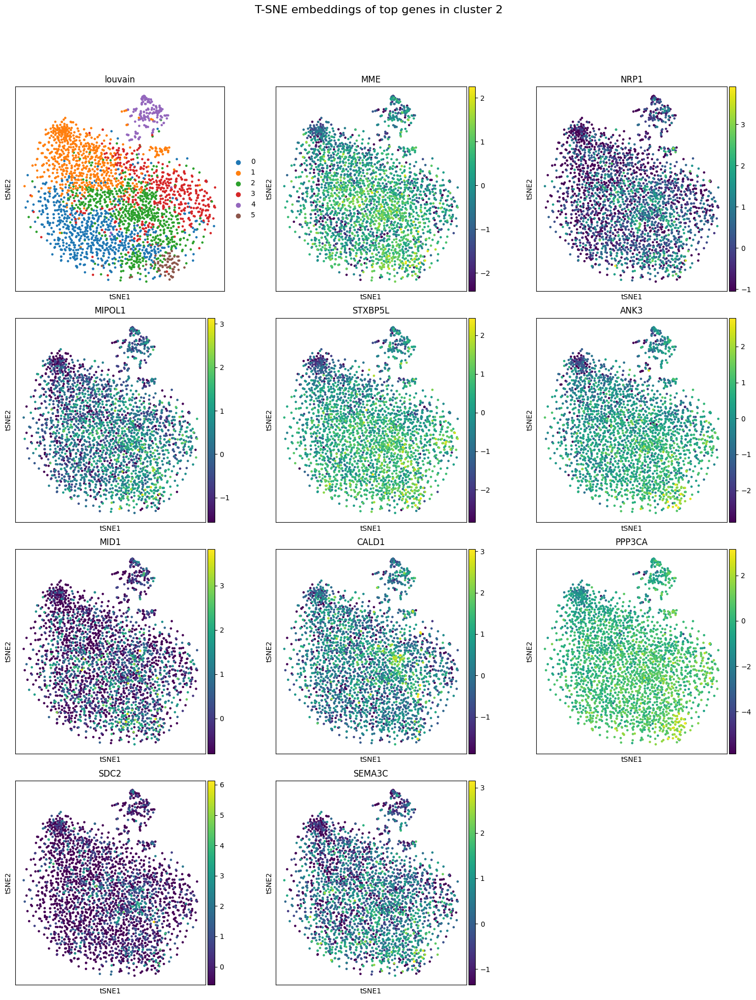

Top genes in cluster 3


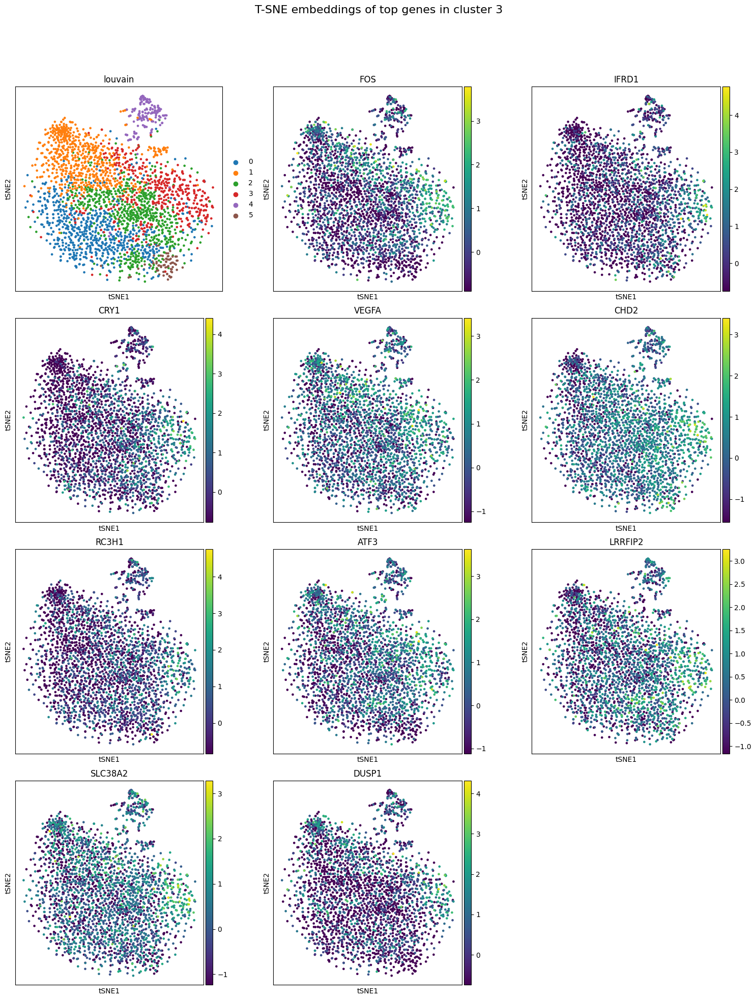

Top genes in cluster 4


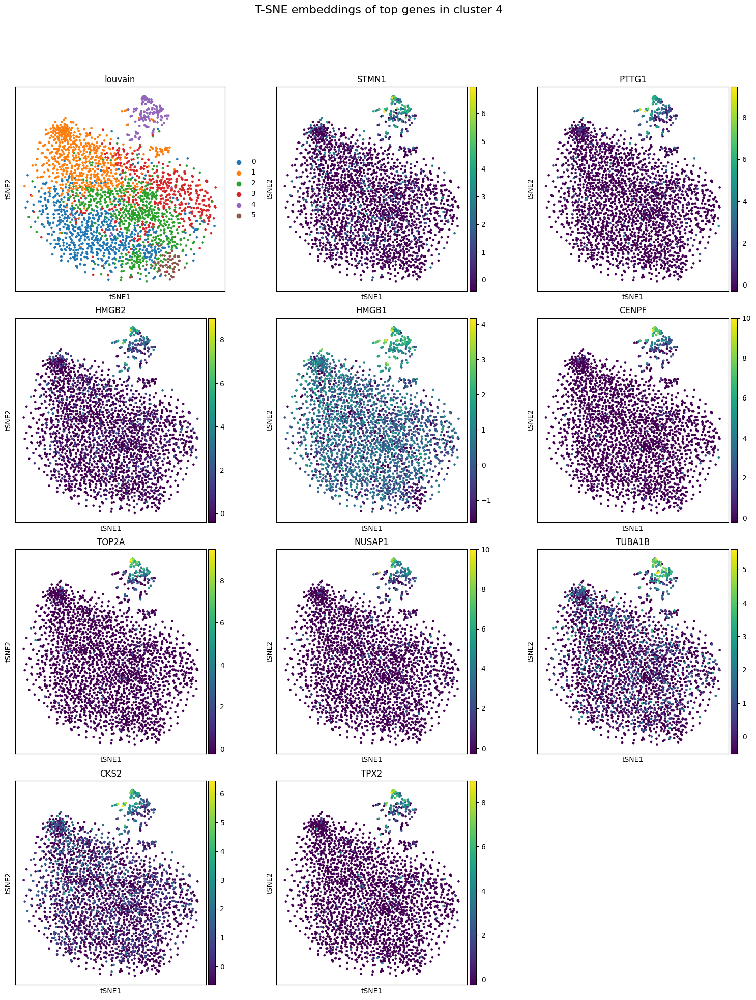

Top genes in cluster 5


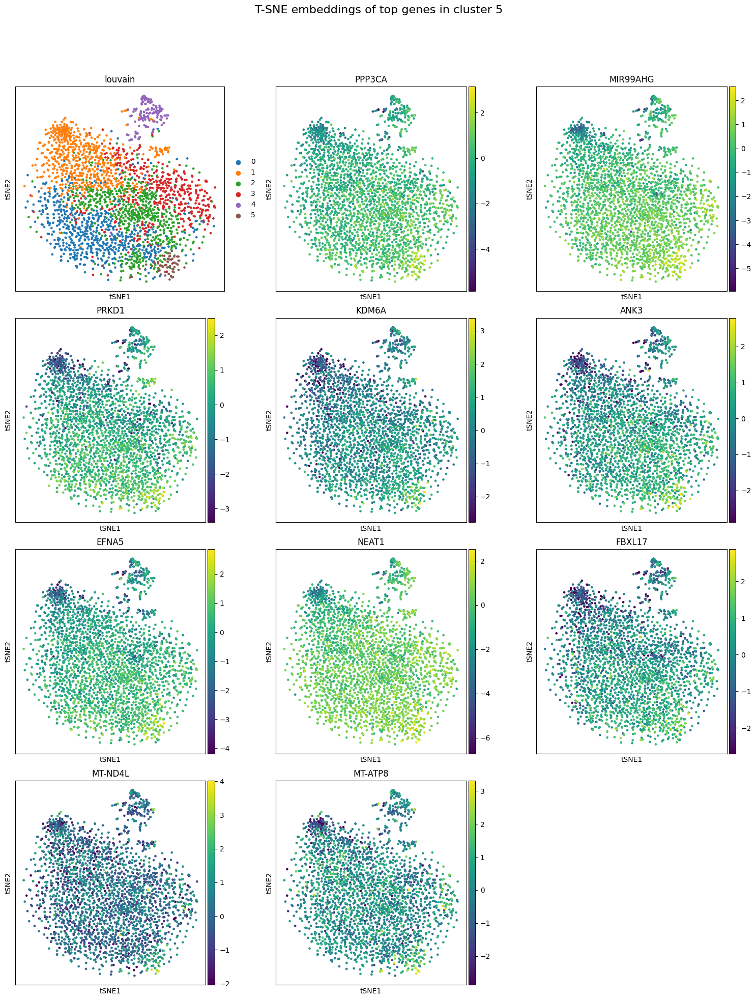

In [45]:
def get_top_n_by_cluster(df, n):
    return df.groupby('cluster').apply(lambda x: x.nlargest(n, 'scores')).reset_index(drop=True)

top_n = 10
top_cluster_genes = get_top_n_by_cluster(cluster_markers_named, top_n)

top_n_genes_dict = top_cluster_genes.groupby('cluster')['genes'].apply(list).to_dict()

for k, v in top_n_genes_dict.items():
    print(f'Top genes in cluster {k}')
    plot_embedding_with_title(
        adata=markers_cluster,
        basis='tsne',
        colors=['louvain', *v],
        title=f'T-SNE embeddings of top genes in cluster {k}',
        save_title=f'images/enz-taz/top_genes_cluster_{k}',
        use_raw=False
    )

In [46]:
top_markers = sorted_markers.head(100).genes.tolist()

In [47]:
marker_table = pd.DataFrame([top_markers[i:i + 5] for i in range(0, len(top_markers), 5)])
marker_table.to_excel('output.xlsx', header=False, index=False)

# Plot Embeddings

In [48]:
sc.set_figure_params(figsize=(5,5), dpi=200, dpi_save=200)

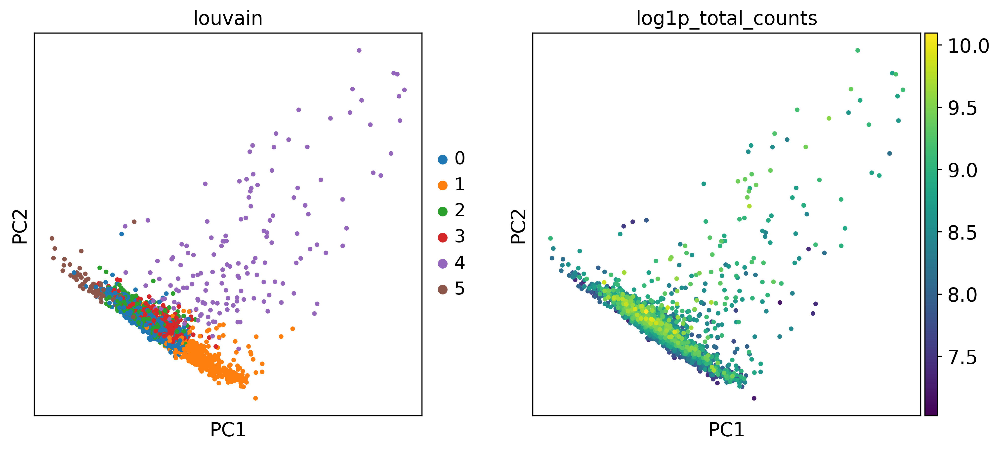

In [49]:
# PCA
sc.pl.embedding(
    markers_cluster,
    basis='pca',  
    color=['louvain','log1p_total_counts'],
    use_raw=False,
    save='.png'
)

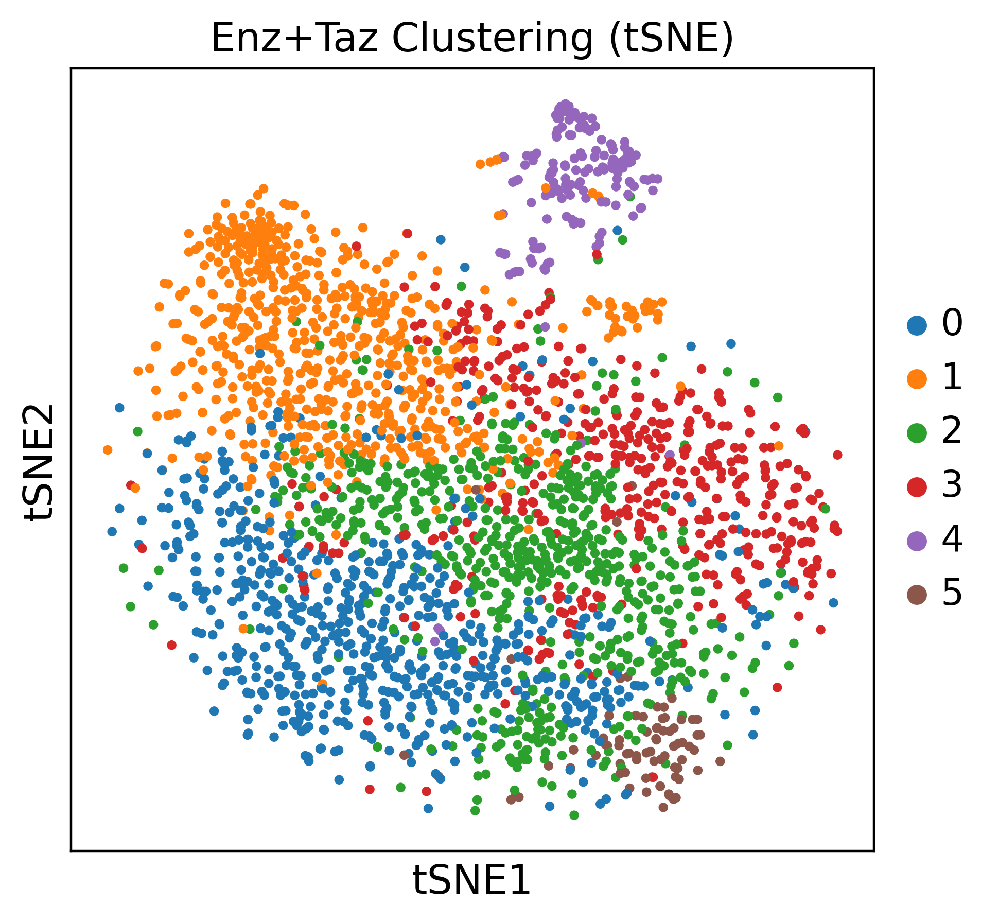

In [50]:
# TSNE
sc.pl.embedding(
    markers_cluster,
    title='Enz+Taz Clustering (tSNE)',
    basis='tsne',  
    color=['louvain'],
    use_raw=False,
    save='.png'
)

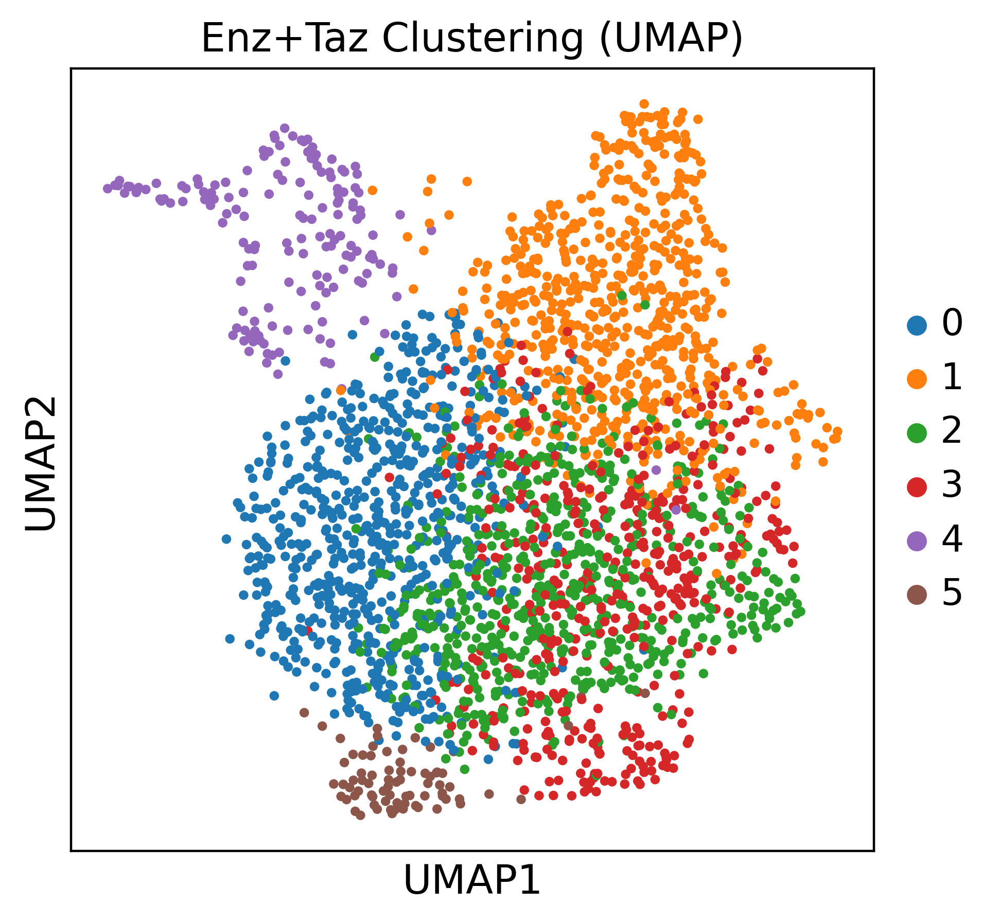

In [51]:
# UMAP
sc.pl.embedding(
    markers_cluster,
    title='Enz+Taz Clustering (UMAP)',
    basis='umap',  
    color=['louvain'],
    use_raw=False,
    save='.png'
)

In [53]:
#markers_cluster.write_h5ad('anndata-objects/enztaz.h5ad')